# INN Hotels Project

## Context

A significant number of hotel bookings are called-off due to cancellations or no-shows. The typical reasons for cancellations include change of plans, scheduling conflicts, etc. This is often made easier by the option to do so free of charge or preferably at a low cost which is beneficial to hotel guests but it is a less desirable and possibly revenue-diminishing factor for hotels to deal with. Such losses are particularly high on last-minute cancellations.

The new technologies involving online booking channels have dramatically changed customers’ booking possibilities and behavior. This adds a further dimension to the challenge of how hotels handle cancellations, which are no longer limited to traditional booking and guest characteristics.

The cancellation of bookings impact a hotel on various fronts:
* Loss of resources (revenue) when the hotel cannot resell the room.
* Additional costs of distribution channels by increasing commissions or paying for publicity to help sell these rooms.
* Lowering prices last minute, so the hotel can resell a room, resulting in reducing the profit margin.
* Human resources to make arrangements for the guests.

## Objective
The increasing number of cancellations calls for a Machine Learning based solution that can help in predicting which booking is likely to be canceled. INN Hotels Group has a chain of hotels in Portugal, they are facing problems with the high number of booking cancellations and have reached out to your firm for data-driven solutions. You as a data scientist have to analyze the data provided to find which factors have a high influence on booking cancellations, build a predictive model that can predict which booking is going to be canceled in advance, and help in formulating profitable policies for cancellations and refunds.

## Data Description
The data contains the different attributes of customers' booking details. The detailed data dictionary is given below.


**Data Dictionary**

* Booking_ID: unique identifier of each booking
* no_of_adults: Number of adults
* no_of_children: Number of Children
* no_of_weekend_nights: Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
* no_of_week_nights: Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel
* type_of_meal_plan: Type of meal plan booked by the customer:
    * Not Selected – No meal plan selected
    * Meal Plan 1 – Breakfast
    * Meal Plan 2 – Half board (breakfast and one other meal)
    * Meal Plan 3 – Full board (breakfast, lunch, and dinner)
* required_car_parking_space: Does the customer require a car parking space? (0 - No, 1- Yes)
* room_type_reserved: Type of room reserved by the customer. The values are ciphered (encoded) by INN Hotels.
* lead_time: Number of days between the date of booking and the arrival date
* arrival_year: Year of arrival date
* arrival_month: Month of arrival date
* arrival_date: Date of the month
* market_segment_type: Market segment designation.
* repeated_guest: Is the customer a repeated guest? (0 - No, 1- Yes)
* no_of_previous_cancellations: Number of previous bookings that were canceled by the customer prior to the current booking
* no_of_previous_bookings_not_canceled: Number of previous bookings not canceled by the customer prior to the current booking
* avg_price_per_room: Average price per day of the reservation; prices of the rooms are dynamic. (in euros)
* no_of_special_requests: Total number of special requests made by the customer (e.g. high floor, view from the room, etc)
* booking_status: Flag indicating if the booking was canceled or not.

## Importing necessary libraries and data

In [1]:
import warnings

warnings.filterwarnings("ignore")
from statsmodels.tools.sm_exceptions import ConvergenceWarning

warnings.simplefilter("ignore", ConvergenceWarning)


import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 200)
pd.set_option("display.float_format", lambda x: "%.5f" % x)

import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from statsmodels.tools.tools import add_constant
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

from sklearn.model_selection import GridSearchCV


from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    precision_recall_curve,
    roc_curve,
    make_scorer,
)

In [2]:
inn = '/Users/daniabankesly/Downloads/INNHotelsGroup.csv'
df = pd.read_csv(inn)

In [3]:
data = df.copy()

In [4]:
def model_performance_classification_statsmodels(
    model, predictors, target, threshold=0.5
):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """

    pred_temp = model.predict(predictors) > threshold
    pred = np.round(pred_temp)

    acc = accuracy_score(target, pred)
    recall = recall_score(target, pred)
    precision = precision_score(target, pred)
    f1 = f1_score(target, pred)

    data_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return data_perf

## Data Overview

- Observations
- Sanity checks

In [5]:
data.head()

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00000,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68000,1,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00000,0,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00000,0,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50000,0,Canceled


In [6]:
data.tail()

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
36270,INN36271,3,0,2,6,Meal Plan 1,0,Room_Type 4,85,2018,8,3,Online,0,0,0,167.80000,1,Not_Canceled
36271,INN36272,2,0,1,3,Meal Plan 1,0,Room_Type 1,228,2018,10,17,Online,0,0,0,90.95000,2,Canceled
36272,INN36273,2,0,2,6,Meal Plan 1,0,Room_Type 1,148,2018,7,1,Online,0,0,0,98.39000,2,Not_Canceled
36273,INN36274,2,0,0,3,Not Selected,0,Room_Type 1,63,2018,4,21,Online,0,0,0,94.50000,0,Canceled
36274,INN36275,2,0,1,2,Meal Plan 1,0,Room_Type 1,207,2018,12,30,Offline,0,0,0,161.67000,0,Not_Canceled


In [7]:
data.shape

(36275, 19)

In [8]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
no_of_adults,36275.00000,1.84496,0.51871,0.00000,2.00000,2.00000,2.00000,4.00000
no_of_children,36275.00000,0.10528,0.40265,0.00000,0.00000,0.00000,0.00000,10.00000
no_of_weekend_nights,36275.00000,0.81072,0.87064,0.00000,0.00000,1.00000,2.00000,7.00000
no_of_week_nights,36275.00000,2.20430,1.41090,0.00000,1.00000,2.00000,3.00000,17.00000
required_car_parking_space,36275.00000,0.03099,0.17328,0.00000,0.00000,0.00000,0.00000,1.00000
lead_time,36275.00000,85.23256,85.93082,0.00000,17.00000,57.00000,126.00000,443.00000
arrival_year,36275.00000,2017.82043,0.38384,2017.00000,2018.00000,2018.00000,2018.00000,2018.00000
arrival_month,36275.00000,7.42365,3.06989,1.00000,5.00000,8.00000,10.00000,12.00000
arrival_date,36275.00000,15.59700,8.74045,1.00000,8.00000,16.00000,23.00000,31.00000
repeated_guest,36275.00000,0.02564,0.15805,0.00000,0.00000,0.00000,0.00000,1.00000


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Booking_ID                            36275 non-null  object 
 1   no_of_adults                          36275 non-null  int64  
 2   no_of_children                        36275 non-null  int64  
 3   no_of_weekend_nights                  36275 non-null  int64  
 4   no_of_week_nights                     36275 non-null  int64  
 5   type_of_meal_plan                     36275 non-null  object 
 6   required_car_parking_space            36275 non-null  int64  
 7   room_type_reserved                    36275 non-null  object 
 8   lead_time                             36275 non-null  int64  
 9   arrival_year                          36275 non-null  int64  
 10  arrival_month                         36275 non-null  int64  
 11  arrival_date   

In [10]:
data["Booking_ID"].nunique()

36275

In [11]:
data = data.drop("Booking_ID", axis=1)
data = data.drop('room_type_reserved', axis=1)

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 17 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   no_of_adults                          36275 non-null  int64  
 1   no_of_children                        36275 non-null  int64  
 2   no_of_weekend_nights                  36275 non-null  int64  
 3   no_of_week_nights                     36275 non-null  int64  
 4   type_of_meal_plan                     36275 non-null  object 
 5   required_car_parking_space            36275 non-null  int64  
 6   lead_time                             36275 non-null  int64  
 7   arrival_year                          36275 non-null  int64  
 8   arrival_month                         36275 non-null  int64  
 9   arrival_date                          36275 non-null  int64  
 10  market_segment_type                   36275 non-null  object 
 11  repeated_guest 

## Observations
* The dataset is vast and clean, with 36275 rows of 19 columns of data, no missing values, and no duplicate values.
* There are now 4 columns of the dtype _object_, 1 column of the dtype _float64_, and 13 columns of the dtype _int64_.
* The top reserved room for `room_type_reserved` is type 1 and the top meal requested is Meal Plan 1.
* The target variable for both Logistic Regression and Decision Tree models will be `booking_status`.
* `room_type_reserved` values are ciphered (encoded) by INN Hotels, providing no use in model building, as well as `Booking_ID` values, providing no useful information for model building, thus both have been dropped.

## Data Preprocessing

- Missing value treatment (if needed)
- Feature engineering (if needed)
- Outlier detection and treatment (if needed)
- Preparing data for modeling
- Any other preprocessing steps (if needed)

In [13]:
data.isna().sum()

no_of_adults                            0
no_of_children                          0
no_of_weekend_nights                    0
no_of_week_nights                       0
type_of_meal_plan                       0
required_car_parking_space              0
lead_time                               0
arrival_year                            0
arrival_month                           0
arrival_date                            0
market_segment_type                     0
repeated_guest                          0
no_of_previous_cancellations            0
no_of_previous_bookings_not_canceled    0
avg_price_per_room                      0
no_of_special_requests                  0
booking_status                          0
dtype: int64

In [14]:
data.duplicated().sum()

10289

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

In [15]:
def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2, 
        sharex=True,  
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    ) 
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    ) 
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )

The above codeblock is a necessary function defined in order to plot a histogram and boxplot in combination. Details include the number of rows of the subplot grid set to 2, the x-axis will be shared among all subplots, when the boxplot is created, a star on the plot indicates the mean value of the column. For histogram, adding mean and median. Lastly a line to show the plot as save as JPG

In [16]:
def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))
        
    ax = sns.countplot(
        data=data,
        x=feature,
        palette='viridis',
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )
        else:
            label = p.get_height()

        x = p.get_x() + p.get_width() / 2
        y = p.get_height()

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points"
        ) 

    plt.show()

The above codeblock is a necessary function defined in order to plot a barplot with a percentage over it. Details include labelling the percent and count of each category, setting the width and height of plot, as well as annotating the percentages and showing the plot.

### Observations of float64 variables

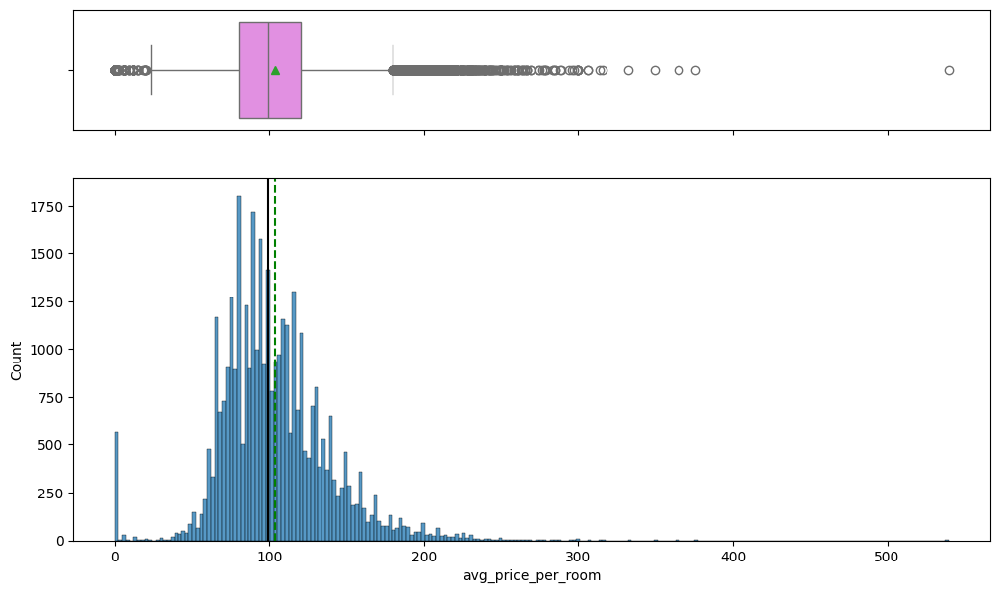

In [17]:
histogram_boxplot(data,'avg_price_per_room')

Distribution is strongly right-skewed, with outliers on both sides, and the average price of the hotel room being €100.

### Observations of int64 variables

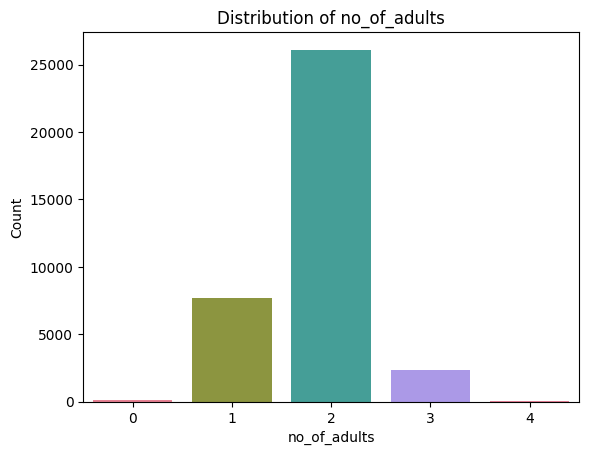

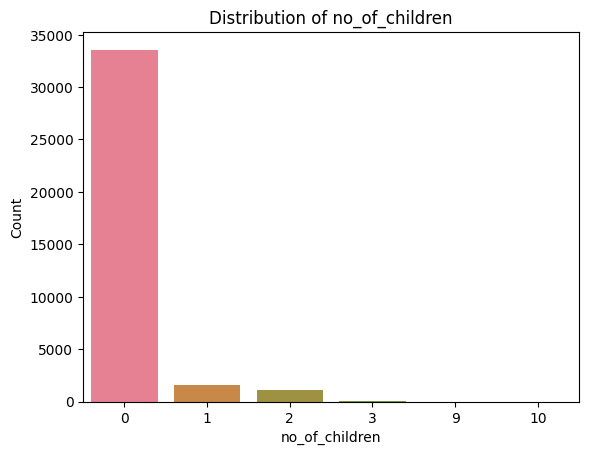

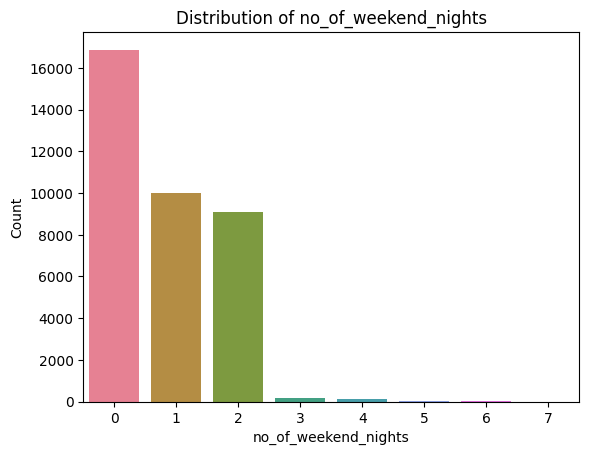

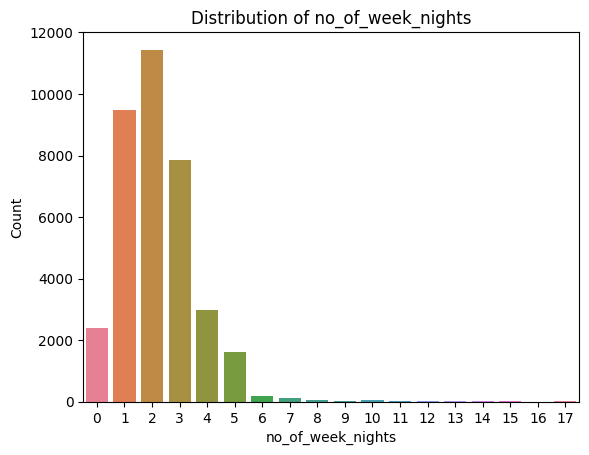

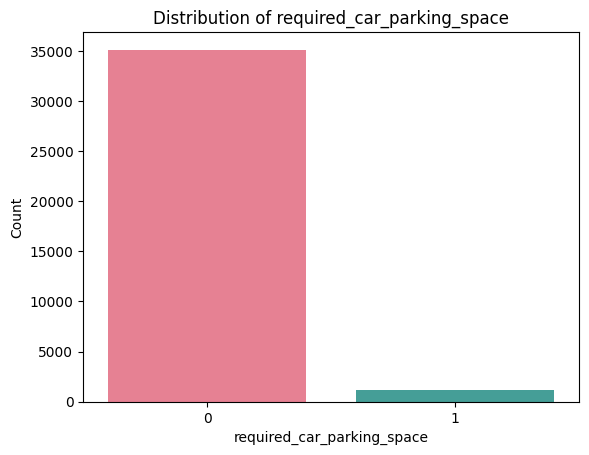

...

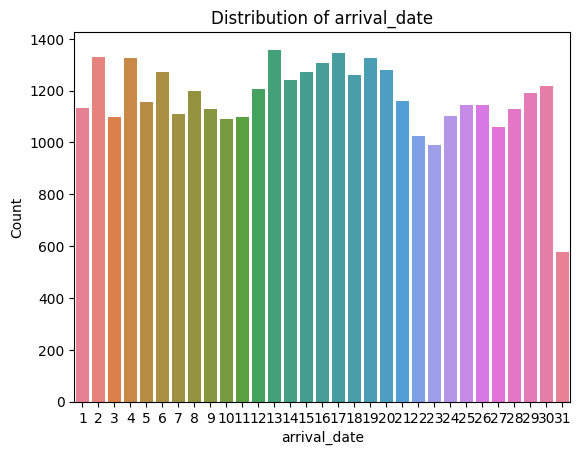

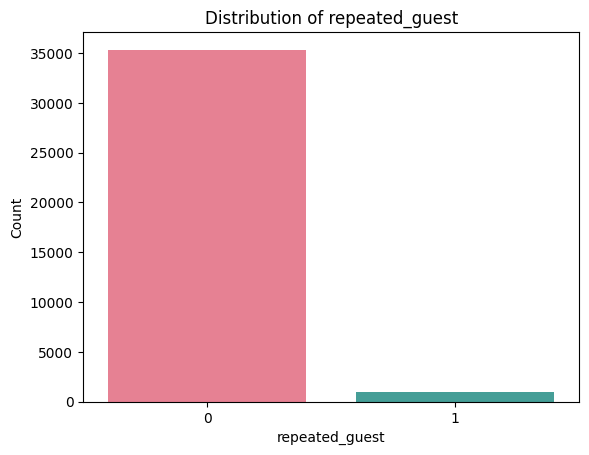

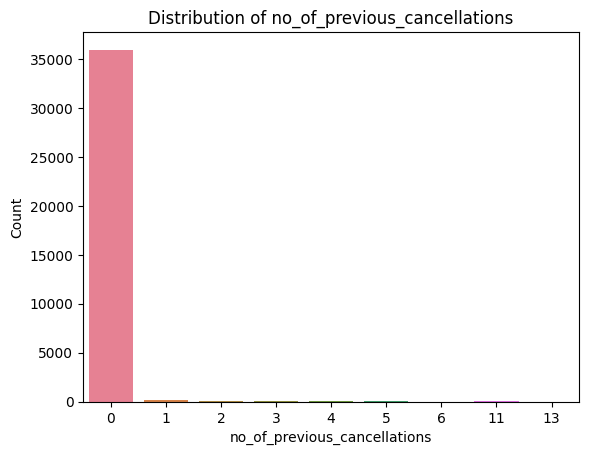

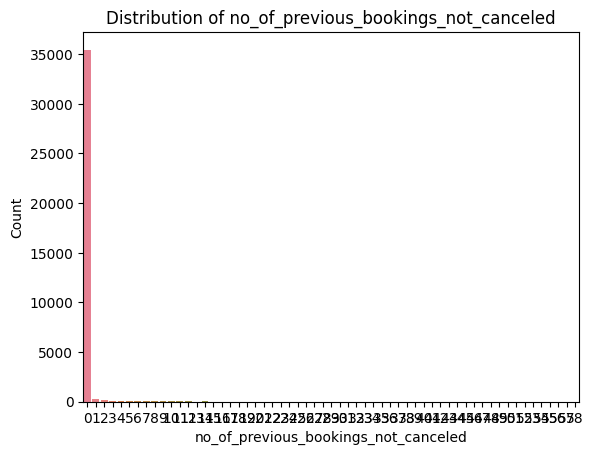

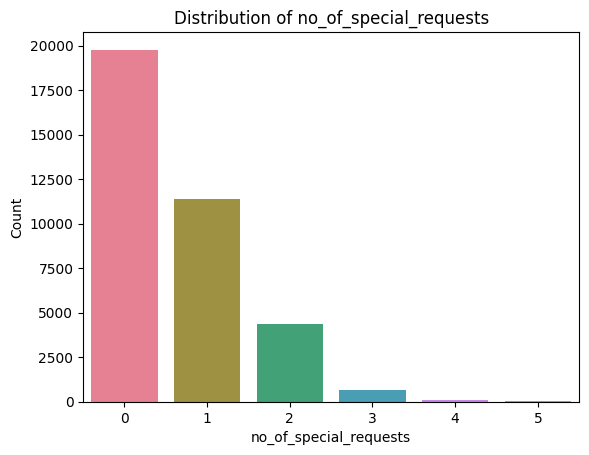

In [18]:
for col in data.columns[data.dtypes == 'int64']:
    ax = sns.countplot(data=data, x=col, hue=col, palette='husl', legend=False)
    ax.set(title=f"Distribution of {col}", xlabel=col, ylabel="Count")
    plt.show()

* The majority of bookings, about 78%, included two or more adults, more than likely for a couple or family travelling for vacation, while 21% of bookings were for a single adult, more than likely a person travelling for business.
* There were no children in about 93% of bookings.
* There are more bookings in the later half of the year, specifically around the colder months, peaking in October.
* About 97% of guests did not request a parking space but of those that did, not a single booking requested more than one space.
* The arrival date shows uniform distribution throughout the month, no preference for beginning or ending weeks of the month.
* The majority of bookings, about 82% occured in the year 2018.
* A very small percentage of about 2.6% of bookings were made by loyal repeat guests.

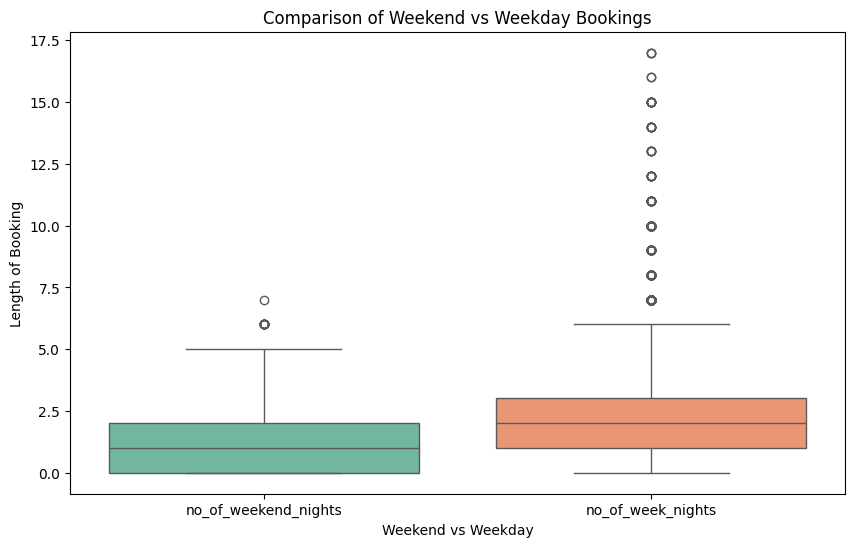

In [19]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=data[['no_of_weekend_nights', 'no_of_week_nights']], palette='Set2')
plt.xlabel('Weekend vs Weekday')
plt.ylabel('Length of Booking')
plt.title('Comparison of Weekend vs Weekday Bookings')
plt.show()

There appear to be more bookings during the week rather than the weekend, also weeknights have more outliers. Averages are quite similar. 

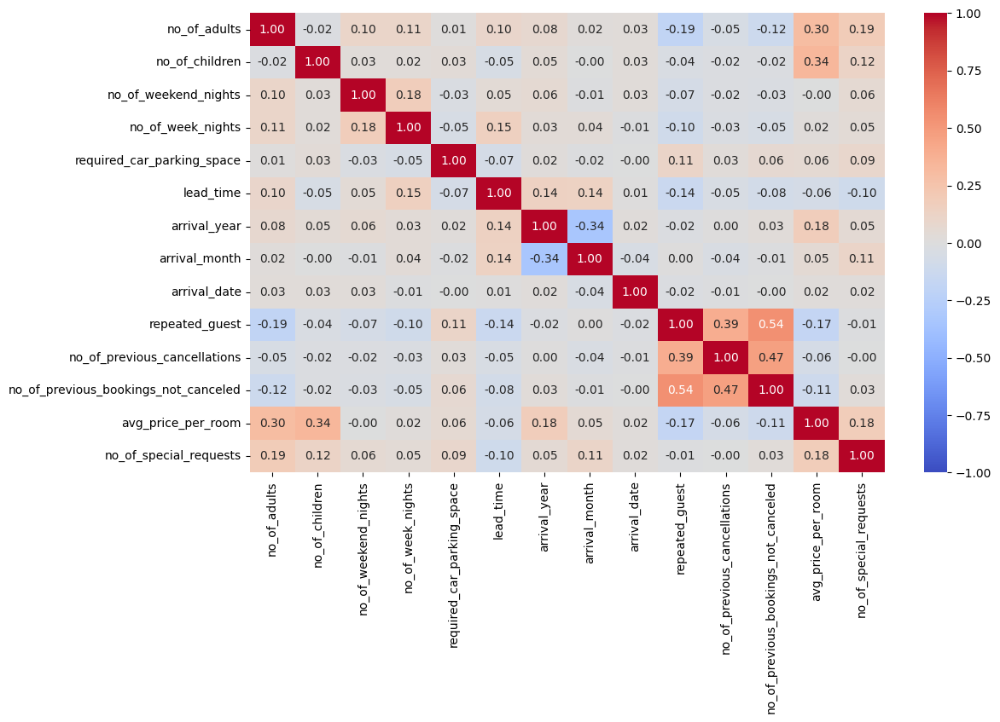

In [20]:
cols_list = data.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(12, 7))
sns.heatmap(
    data[cols_list].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="coolwarm"
)
plt.show()

- Most of the variables shows no or essentially useless correlations...
- The highest correlation is between `repeated_guest` and `no_of_previous_bookings_not_canceled` reflective of how important customer loyalty is to the customer and hotel.

Positive correlations to note:

- `no_of_adults` and `no_of_children` with `avg_price_per_room` which follows logically as the more the customers the more space needed so more rooms, so the higher the cost.
- `no_of_previous_bookings_not_canceled` and `no_of_previous_cancellations` by a customer and `repeated_guest`
- `lead_time` and `no_of_week_nights`, may be indicative of early bookings corresponding to business or owkr related trips

Negative correlations to note:
- `avg_price_per_room` and `repeated_guest`, may be indicative of special offers to preferred customers
- `arrival_year` and `arrival_month` but this should not affect our review

**Leading Questions**:
1. What are the busiest months in the hotel?
2. Which market segment do most of the guests come from?
3. Hotel rates are dynamic and change according to demand and customer demographics. What are the differences in room prices in different market segments?
4. What percentage of bookings are canceled?
5. Repeating guests are the guests who stay in the hotel often and are important to brand equity. What percentage of repeating guests cancel?
6. Many guests have special requirements when booking a hotel room. Do these requirements affect booking cancellation?

In [21]:
data.groupby('arrival_month').count().sort_values(by='booking_status', ascending=False)['booking_status'].head(3)

arrival_month
10    5317
9     4611
8     3813
Name: booking_status, dtype: int64

1. The busiest months for the hotel in Portugal are October, September, and August, respectively.

In [22]:
data.groupby('market_segment_type').count().sort_values(by='booking_status', ascending=False)['booking_status']

market_segment_type
Online           23214
Offline          10528
Corporate         2017
Complementary      391
Aviation           125
Name: booking_status, dtype: int64

2. A total of 23214, which is about 64% of the 36275 total bookings, are made online.


In [23]:
data.groupby('market_segment_type').agg({'avg_price_per_room':'mean'}).sort_values(by='avg_price_per_room',ascending=False).reset_index()

,market_segment_type,avg_price_per_room
0,Online,112.25685
1,Aviation,100.70400
2,Offline,91.63268
3,Corporate,82.91174
4,Complementary,3.14176


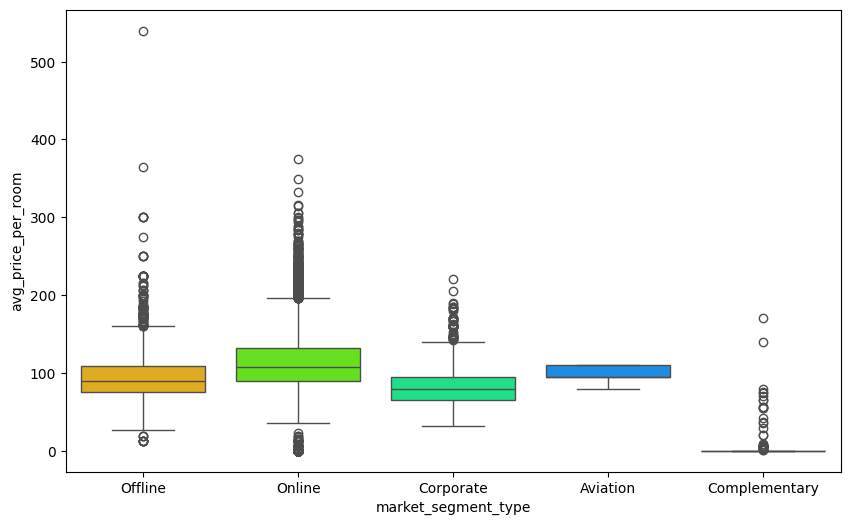

In [24]:
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=data, x="market_segment_type", y="avg_price_per_room", hue="market_segment_type", palette="gist_rainbow", legend=False
)
plt.show()

3. When comparing rates across different market segments, it can be observed booking online yields the highest average price per room at €112.25. This number is closely followed by Aviation, then Offline, Corporate, and lastly Complementary, which follows logically.

In [25]:
data['booking_status'].value_counts()

Not_Canceled    24390
Canceled        11885
Name: booking_status, dtype: int64

4. About one-third of bookings were cancelled, 11885 of the total 36275.

In [26]:
data.groupby('repeated_guest')['booking_status'].value_counts()

repeated_guest  booking_status
0               Not_Canceled      23476
                Canceled          11869
1               Not_Canceled        914
                Canceled             16
Name: booking_status, dtype: int64

5. Repeat guests rarely cancel, under 2% or 16 of the 930 total bookings made were cancelled.

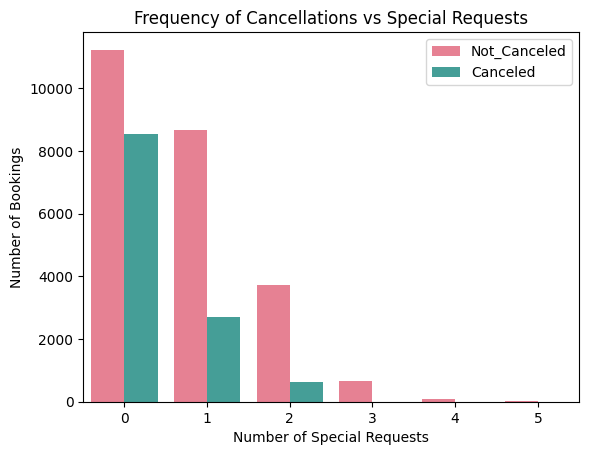

In [27]:
colors = sns.color_palette("husl", 2)

sns.countplot(data=data, hue='booking_status', x='no_of_special_requests', palette=colors)
plt.legend(loc='upper right')
plt.xlabel('Number of Special Requests')
plt.ylabel('Number of Bookings')
plt.title('Frequency of Cancellations vs Special Requests')
plt.show()

6. It appears that as the number of special requests increase, the proportion of cancellations decrease. This pattern is progressive until the requests hit the number 3, afterwards there are no cancellations observed.

## Building a Logistic Regression model

In [28]:
##  Function to calculate f1 score
def get_f1_score(model, predictors, target):
    """
    model: classifier
    predictors: independent variables
    target: dependent variable
    
    """
    prediction = model.predict(predictors)
    return f1_score(target, prediction)

In [29]:
data["booking_status"] = data["booking_status"].apply(lambda x: 1 if x == "Canceled" else 0)

In [30]:
X = data.drop('booking_status',axis=1)
Y = data['booking_status']

X = pd.get_dummies(X, drop_first=True)

x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)

x_train.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,type_of_meal_plan_Meal Plan 2,type_of_meal_plan_Meal Plan 3,type_of_meal_plan_Not Selected,market_segment_type_Complementary,market_segment_type_Corporate,market_segment_type_Offline,market_segment_type_Online
13662,1,0,0,1,0,163,2018,10,15,0,0,0,115.00000,0,0,0,0,0,0,1,0
26641,2,0,0,3,0,113,2018,3,31,0,0,0,78.15000,1,0,0,0,0,0,0,1
17835,2,0,2,3,0,359,2018,10,14,0,0,0,78.00000,1,0,0,0,0,0,1,0
21485,2,0,0,3,0,136,2018,6,29,0,0,0,85.50000,0,0,0,1,0,0,0,1
5670,2,0,1,2,0,21,2018,8,15,0,0,0,151.00000,0,0,0,0,0,0,0,1


In [31]:
y_train.head()

13662    1
26641    0
17835    0
21485    1
5670     1
Name: booking_status, dtype: int64

In [32]:
print("{0:0.2f}% data is in training set".format((len(x_train)/len(df.index)) * 100))
print("{0:0.2f}% data is in test set".format((len(x_test)/len(df.index)) * 100))

70.00% data is in training set
30.00% data is in test set


In [33]:
print("Shape of Training set : ", x_train.shape)
print("Shape of test set : ", x_test.shape)
print(' ')
print("Percentage of classes in training set:")
print(y_train.value_counts(normalize=True))
print(' ')
print("Percentage of classes in test set:")
print(y_test.value_counts(normalize=True))

Shape of Training set :  (25392, 21)
Shape of test set :  (10883, 21)
 
Percentage of classes in training set:
0   0.67064
1   0.32936
Name: booking_status, dtype: float64
 
Percentage of classes in test set:
0   0.67638
1   0.32362
Name: booking_status, dtype: float64


Other prep steps for model building include encoding categorical features and splitting the data into training and testing to be able to evaluate the model that we build on the train data.

**Model can make wrong predictions in the case that:**

1. Predicting a customer will cancel their booking but they actually end up not cancelling.

2. Predicting a customer will not cancel their booking they actually end up cancelling.

They are equally as important. If we wrongly predict a booking won't be canceled and it is, the hotel faces resource loss and additional distribution costs. Conversely, if we anticipate a cancellation that doesn't occur, reallocating the room may lead to expenses like offering a complimentary upgrade, potential loss of repeat business, and negative reviews.
Similarly, if we incorrectly predict a non-cancellation and it happens, we lose out on reservation revenue, incur remarketing expenses, and may need to rebook the room at a discount. Conversely, anticipating a cancellation that doesn't materialize can lead to dissatisfaction with service and damage to the hotel's brand equity.

We need to focus on the _F1 score_, as it should be maximized, the greater the `f1_score`, the higher the chances of identifying both classes correctly, at the same time minimizing False Negatives and False Positives.

In [34]:
lg = LogisticRegression(solver="liblinear", random_state=1)
model = lg.fit(x_train, y_train)

In [35]:
y_pred_train = lg.predict(x_train)

In [36]:
print("Training set performance:")
print("Accuracy:", accuracy_score(y_train, y_pred_train))
print("Precision:", precision_score(y_train, y_pred_train))
print("Recall:", recall_score(y_train, y_pred_train))
print("F1:", f1_score(y_train, y_pred_train))

Training set performance:
Accuracy: 0.7976134215500945
Precision: 0.7317423806785509
Recall: 0.6086332655745545
F1: 0.664534238527319


In [37]:
y_pred_test = lg.predict(x_test)

In [38]:
print("Test set performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_test))
print("Precision:", precision_score(y_test, y_pred_test))
print("Recall:", recall_score(y_test, y_pred_test))
print("F1:", f1_score(y_test, y_pred_test))

Test set performance:
Accuracy: 0.8018009739961408
Precision: 0.7297206327835746
Recall: 0.6155593412833618
F1: 0.6677960880948715


The f1_score on the train and test sets are comparable, and both training and testing Precision rates are about 0.73, which suggests that the model is demonstrating results that are broadly applicable.

In [39]:
X = data.drop(["booking_status"], axis=1)
Y = data["booking_status"]

X = pd.get_dummies(X, drop_first=True)

X = sm.add_constant(X)

X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.30, random_state=1
)

The above codeblock uses statsmodel library to build a regression model, adding a constant and splitting data into train and test sets

In [40]:
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

logit = sm.Logit(y_train, X_train.astype(float))
lg = logit.fit(disp=False)

print(lg.summary())

                           Logit Regression Results                           
Dep. Variable:         booking_status   No. Observations:                25392
Model:                          Logit   Df Residuals:                    25370
Method:                           MLE   Df Model:                           21
Date:                Fri, 19 Apr 2024   Pseudo R-squ.:                  0.3268
Time:                        02:20:48   Log-Likelihood:                -10833.
converged:                      False   LL-Null:                       -16091.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                           coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
const                                 -946.9626    120.195     -7.879      0.000   -1182.540    -711.385
no_of_adults                             0.0662      

In [41]:
print("Training performance:")
model_performance_classification_statsmodels(lg, X_train, y_train)

Training performance:


,Accuracy,Recall,Precision,F1
0,0.80462,0.62549,0.74093,0.67834


### Observations
When coefficients are positive, it suggests that as the attribute value increases, the probability of a hotel booking being canceled also to increases.

On the other hand, negative coefficients imply that as the attribute value increases, the likelihood of a hotel booking being canceled tends to decrease.

p-value indicates significance of a variable. Generally, significance level is accepted at be at 5% or 0.05, thus any variable with p-values less than 0.05 would be considered significant. However, these variables are at risk of suffering multicollinearity. Next, we will remove multicollinearity from the data to achieve reliable coefficients and p-values.

## Checking Multicollinearity

- In order to make statistical inferences from a logistic regression model, it is important to ensure that there is no multicollinearity present in the data.

Per the general rule of thumb:

VIF = 1 → no correlation between the 
k
th predictor and the remaining predictor variables

VIF ≥ 5 → moderate multicollinearity

VIF ≥ 10 → high multicollinearity

In [42]:
def checking_vif(predictors):
    vif = pd.DataFrame()
    vif["feature"] = predictors.columns

    vif["VIF"] = [
        variance_inflation_factor(predictors.values, i)
        for i in range(len(predictors.columns))
    ]
    return vif

In [43]:
checking_vif(X_train).sort_values(by='VIF', ascending=False)

,feature,VIF
0,const,39127069.81667
21,market_segment_type_Online,70.86711
20,market_segment_type_Offline,63.67250
19,market_segment_type_Corporate,16.82208
18,market_segment_type_Complementary,4.43861
10,repeated_guest,1.78005
13,avg_price_per_room,1.75810
12,no_of_previous_bookings_not_canceled,1.65169
7,arrival_year,1.41844
11,no_of_previous_cancellations,1.39498


Aside from the dummy variables, no other predictor variables display VIF above 5, therefore no multicollinearity

Let's drop variables with high p-values one at a time by:
- Building a model, check the p-values of the variables, and drop the column with the highest p-value.
- Create a new model without the dropped feature, check the p-values of the variables, and drop the column with the highest p-value.
- Repeat the above two steps till there are no columns with p-value > 0.05.

In [44]:
cols = X_train.columns.tolist()

max_p_value = 1

while len(cols) > 0:
    X_train_aux = X_train[cols]

    model = sm.Logit(y_train, X_train_aux).fit(disp=False)

    p_values = model.pvalues
    max_p_value = max(p_values)

    feature_with_p_max = p_values.idxmax()

    if max_p_value > 0.05:
        cols.remove(feature_with_p_max)
    else:
        break

selected_features = cols
print(selected_features)

['const', 'no_of_adults', 'no_of_weekend_nights', 'no_of_week_nights', 'required_car_parking_space', 'lead_time', 'arrival_year', 'arrival_month', 'repeated_guest', 'no_of_previous_cancellations', 'avg_price_per_room', 'no_of_special_requests', 'type_of_meal_plan_Meal Plan 2', 'type_of_meal_plan_Not Selected', 'market_segment_type_Corporate', 'market_segment_type_Offline']


In [45]:
X_train2 = X_train[selected_features]

In [46]:
logit2 = sm.Logit(y_train, X_train2.astype(float))
lg2 = logit2.fit(disp=False)
print(lg2.summary())

                           Logit Regression Results                           
Dep. Variable:         booking_status   No. Observations:                25392
Model:                          Logit   Df Residuals:                    25376
Method:                           MLE   Df Model:                           15
Date:                Fri, 19 Apr 2024   Pseudo R-squ.:                  0.3256
Time:                        02:20:51   Log-Likelihood:                -10852.
converged:                       True   LL-Null:                       -16091.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                           -944.7563    119.596     -7.900      0.000   -1179.160    -710.353
no_of_adults                       0.0703      0.036      1.975      0.

Now, no feature has a p-value greater than 0.05, thus features in X_train2 will be taken as the final ones and lg2 as final model.

### Coefficient interpretations

Coefficients for the following: `no_of_adults`, total nights booked (`no_of_weekend_nights` & `no_of_week_nights`), `lead_time`, `arrival_year`, `no_of_previous_cancellations`, `avg_price_per_room`, `type_of_meal_plan_Meal Plan 2`, and `type_of_meal_plan_Not Selected` all came out to be positive, indicating that an increase in these variables should lead to increases in chances of a hotel booking getting cancelled.

Coefficients for the following: `required_car_parking_space`, `arrival_month`, `repeated_guest`, `no_of_special_requests`, `market_segment_type_Corporate`, and `market_segment_type_Offline` all came out to be negative, indicating that an increase in these variables should lead to decreases in chances of a hotel booking getting cancelled

In [47]:
odds = np.exp(lg2.params)

perc_change_odds = (np.exp(lg2.params) - 1) * 100

pd.set_option("display.max_columns", None)

pd.DataFrame({"Odds": odds, "Change_odds": perc_change_odds}, index=X_train2.columns).sort_values(by='Change_odds')

,Odds,Change_odds
const,0.00000,-100.00000
repeated_guest,0.06059,-93.94121
market_segment_type_Offline,0.17351,-82.64914
required_car_parking_space,0.20357,-79.64273
no_of_special_requests,0.23259,-76.74069
market_segment_type_Corporate,0.45040,-54.95973
arrival_month,0.96114,-3.88610
lead_time,1.01579,1.57892
avg_price_per_room,1.01658,1.65819
no_of_week_nights,1.03482,3.48185


odds = exp(b), thus the percent change in odds can be found with odds = (exp(b) - 1) * 100

- `repeated_guest`: If all other features constant, a unit change in `repeated_guest` decreases the odds of a cancelled booking by 0.06 times, which is a 94% decrease.

- `market_segment_type_Offline`: If all other features constant, a unit change in `market_segment_type_Offline` decreases the odds of a cancelled booking by 0.17 times, which is an 83% decrease.

- `required_car_parking_space`: If all other features constant, a unit change in `required_car_parking_space` decreases the odds of a cancelled booking by 0.20 times, which is an 80% decrease.

- `avg_price_per_room`: If all other features constant, a unit change increase, or a single euro more being charged, increases the odds of a cancelled booking by 1.02 times, which is a 2% increase.

- Looking at `no_of_weekend_nights` and `no_of_week_nights`, a unit change increase, or a single additional night booked increases the odds of a cancelled booking by 1.96 times, which is a 6% increase.

## Model performance evaluation

The above codeblock is a necessary defined function allowing us to compute different metrics to check performance of a classification model. This is done by checking which probabilities are greater than threshold, calculating accuracy, Recall, Precision, and the F1 score.

In [48]:
def confusion_matrix_statsmodels(model, predictors, target, threshold=0.5):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """
    y_pred = model.predict(predictors) > threshold
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6,4))
    sns.heatmap(cm, annot=labels, fmt="", cmap='viridis')
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

The above codeblock is a necessary defined function to plot the confusion matrix of the classification model

In [49]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="", cmap='viridis')
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

In [50]:
## Function to create confusion matrix
def make_confusion_matrix(model,y_actual,labels=[1, 0]):
    '''
    model : classifier to predict values of X
    y_actual : ground truth  
    
    '''
    y_predict = model.predict(X_test)
    cm=metrics.confusion_matrix( y_actual, y_predict, labels=[0, 1])
    data_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]],
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (6,4))
    sns.heatmap(data_cm, annot=labels,fmt='',cmap='viridis')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

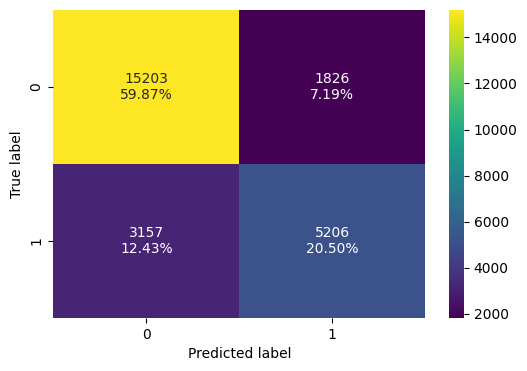

In [51]:
confusion_matrix_statsmodels(lg2, X_train2, y_train)

In [52]:
log_reg_model_train_perf = model_performance_classification_statsmodels(lg2, X_train2, y_train)

print("Training performance:")
log_reg_model_train_perf

Training performance:


,Accuracy,Recall,Precision,F1
0,0.80376,0.62250,0.74033,0.67632


### ROC-AUC Training

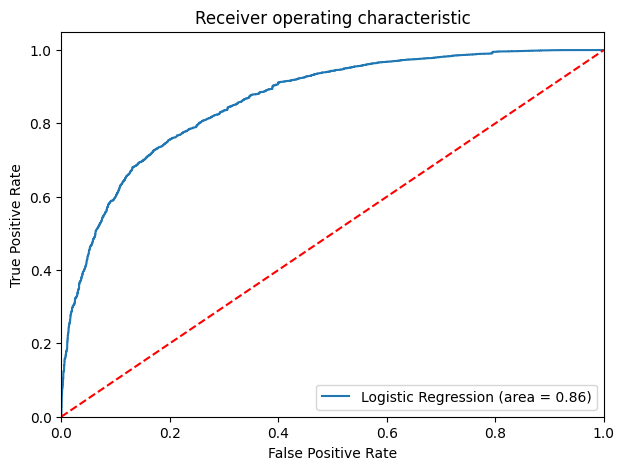

In [53]:
logit_roc_auc_train = roc_auc_score(y_train, lg2.predict(X_train2))
fpr, tpr, thresholds = roc_curve(y_train, lg2.predict(X_train2))
plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, label="Logistic Regression (area = %0.2f)" % logit_roc_auc_train)
plt.plot([0, 1], [0, 1], "r--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc="lower right")
plt.show()

The model appears to be performing well on the training set, and we can explore improving precision score by changing the model threshold using AUC-ROC Curve. The optimal threshold occurs where the true positive rate (tpr) is highest and the false positive rate (fpr) is lowest

In [54]:
fpr, tpr, thresholds = roc_curve(y_train, lg2.predict(X_train2))

optimal_idx = np.argmax(tpr - fpr)
optimal_threshold_auc_roc = thresholds[optimal_idx]
print(optimal_threshold_auc_roc)

0.38250378562235565


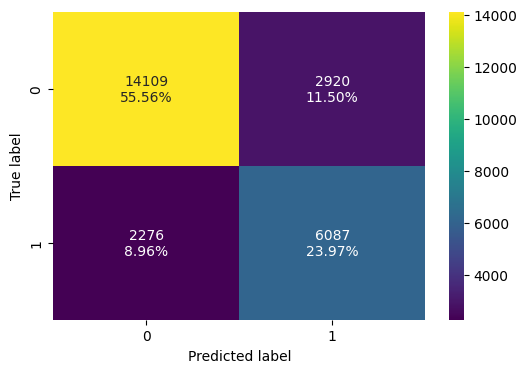

In [55]:
confusion_matrix_statsmodels(lg2, X_train2, y_train, threshold=optimal_threshold_auc_roc)

In [56]:
log_reg_model_train_perf_threshold_auc_roc = model_performance_classification_statsmodels(
    lg2, X_train2, y_train, threshold=optimal_threshold_auc_roc)

print("Training performance:")
log_reg_model_train_perf_threshold_auc_roc

Training performance:


,Accuracy,Recall,Precision,F1
0,0.79537,0.72785,0.67581,0.70086


Adopting the optimal threshold, it can be observed that the precision score decreased from 0.74 to 0.67, but, more importantly, both the recall and F1 scores improved! 0.62 to 0.72 and 0.67 to 0.70, respectively.
Thus, our latest model with threshold of about 0.38 is far better suited for Portugal's INN Hotels case.

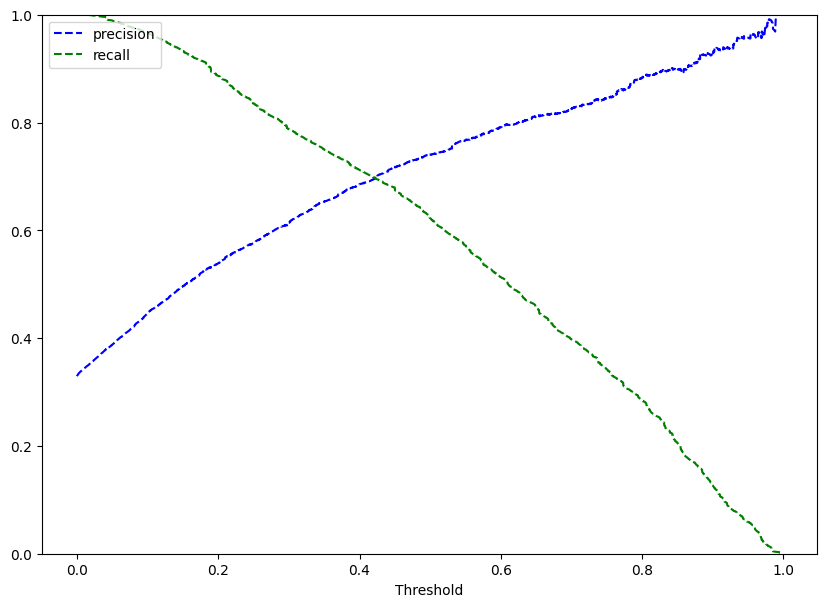

In [57]:
y_scores = lg2.predict(X_train2)
prec, rec, tre = precision_recall_curve(y_train, y_scores,)


def plot_prec_recall_vs_tresh(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], "b--", label="precision")
    plt.plot(thresholds, recalls[:-1], "g--", label="recall")
    plt.xlabel("Threshold")
    plt.legend(loc="upper left")
    plt.ylim([0, 1])


plt.figure(figsize=(10, 7))
plot_prec_recall_vs_tresh(prec, rec, tre)
plt.show()

Our observed threshold of approximately 0.42 allows us to reach a perfect balance of recall and precision scores, thus we can set it in stone

In [58]:
optimal_threshold_curve = 0.42

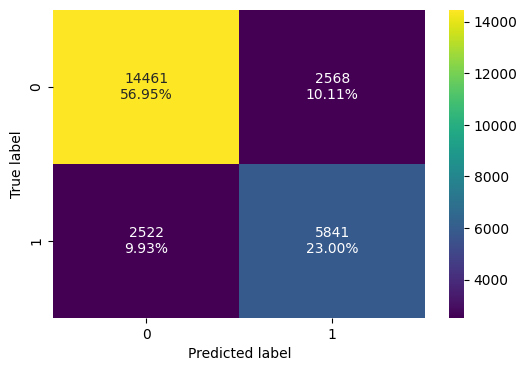

In [59]:
confusion_matrix_statsmodels(lg2, X_train2, y_train, threshold=optimal_threshold_curve)

In [60]:
log_reg_model_train_perf_threshold_curve = model_performance_classification_statsmodels(
    lg2, X_train2, y_train, threshold=optimal_threshold_curve
)
print("Training performance:")
log_reg_model_train_perf_threshold_curve

Training performance:


,Accuracy,Recall,Precision,F1
0,0.79954,0.69843,0.69461,0.69652


Model is performing well on training set, and no significant improvement in the model performance is observed.

## Final Model Summary

In [61]:
models_train_comp_df = pd.concat(
    [
        log_reg_model_train_perf.T,
        log_reg_model_train_perf_threshold_auc_roc.T,
        log_reg_model_train_perf_threshold_curve.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Logistic Regression sklearn",
    "Logistic Regression-0.38 Threshold",
    "Logistic Regression-0.42 Threshold",
]

print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Logistic Regression sklearn,Logistic Regression-0.38 Threshold,Logistic Regression-0.42 Threshold
Accuracy,0.80376,0.79537,0.79954
Recall,0.62250,0.72785,0.69843
Precision,0.74033,0.67581,0.69461
F1,0.67632,0.70086,0.69652


In [62]:
X_test2 = X_test[list(X_train2.columns)]

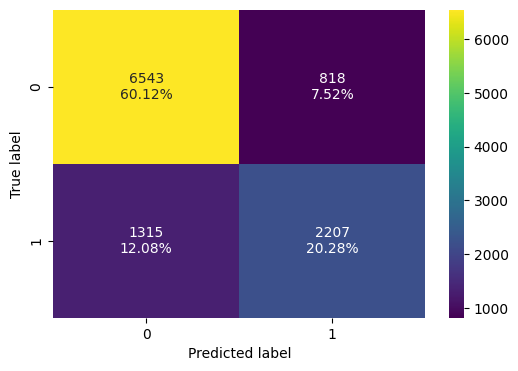

In [63]:
confusion_matrix_statsmodels(lg2, X_test2, y_test)

In [64]:
log_reg_model_test_perf = model_performance_classification_statsmodels(lg2, X_test2, y_test)

print("Test performance:")
log_reg_model_test_perf

Test performance:


,Accuracy,Recall,Precision,F1
0,0.80401,0.62663,0.72959,0.67420


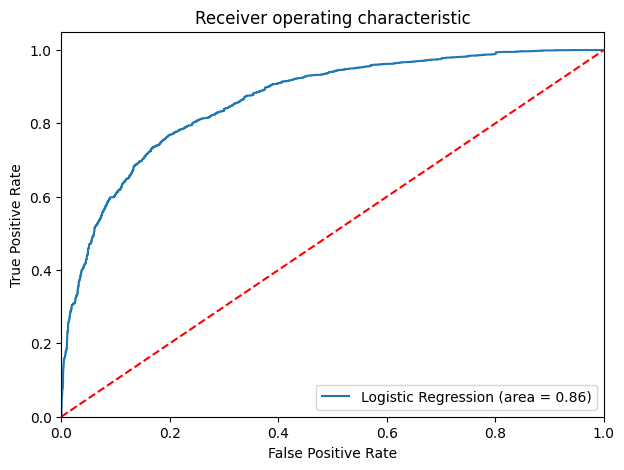

In [65]:
logit_roc_auc_train = roc_auc_score(y_test, lg2.predict(X_test2))
fpr, tpr, thresholds = roc_curve(y_test, lg2.predict(X_test2))
plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, label="Logistic Regression (area = %0.2f)" % logit_roc_auc_train)
plt.plot([0, 1], [0, 1], "r--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc="lower right")
plt.show()

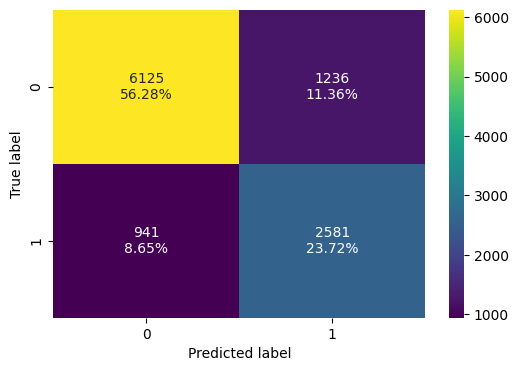

In [66]:
confusion_matrix_statsmodels(lg2, X_test2, y_test, threshold=optimal_threshold_auc_roc)

In [67]:
log_reg_model_test_perf_threshold_auc_roc = model_performance_classification_statsmodels(
    lg2, X_test2, y_test, threshold=optimal_threshold_auc_roc
)
print("Test performance:")
log_reg_model_test_perf_threshold_auc_roc

Test performance:


,Accuracy,Recall,Precision,F1
0,0.79996,0.73282,0.67619,0.70337


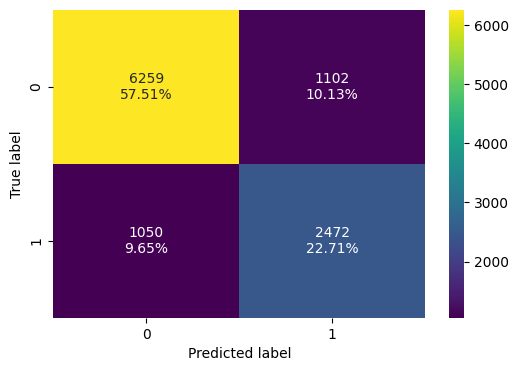

In [68]:
confusion_matrix_statsmodels(lg2, X_test2, y_test, threshold=optimal_threshold_curve)

In [69]:
log_reg_model_test_perf_threshold_curve = model_performance_classification_statsmodels(
    lg2, X_test2, y_test, threshold=optimal_threshold_curve
)
print("Test performance:")
log_reg_model_test_perf_threshold_curve

Test performance:


,Accuracy,Recall,Precision,F1
0,0.80226,0.70187,0.69166,0.69673


In [70]:
models_train_comp_df = pd.concat(
    [
        log_reg_model_train_perf.T,
        log_reg_model_train_perf_threshold_auc_roc.T,
        log_reg_model_train_perf_threshold_curve.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Logistic Regression sklearn",
    "Logistic Regression-0.38 Threshold",
    "Logistic Regression-0.42 Threshold",
]

print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Logistic Regression sklearn,Logistic Regression-0.38 Threshold,Logistic Regression-0.42 Threshold
Accuracy,0.80376,0.79537,0.79954
Recall,0.62250,0.72785,0.69843
Precision,0.74033,0.67581,0.69461
F1,0.67632,0.70086,0.69652


In [71]:
models_test_comp_df = pd.concat(
    [
        log_reg_model_test_perf.T,
        log_reg_model_test_perf_threshold_auc_roc.T,
        log_reg_model_test_perf_threshold_curve.T,
    ],
    axis=1,
)
models_test_comp_df.columns = [
    "Logistic Regression sklearn",
    "Logistic Regression-0.38 Threshold",
    "Logistic Regression-0.42 Threshold",
]

print("Test set performance comparison:")
models_test_comp_df

Test set performance comparison:


,Logistic Regression sklearn,Logistic Regression-0.38 Threshold,Logistic Regression-0.42 Threshold
Accuracy,0.80401,0.79996,0.80226
Recall,0.62663,0.73282,0.70187
Precision,0.72959,0.67619,0.69166
F1,0.67420,0.70337,0.69673


## Model Performance Comparison and Conclusions

**Performance:** built a predictive model for Portugal's INN Hotels to help predict which bookings will be canceled with an F1 score of 0.70 on the training set. 

**Training & Testing:** All logistic regression models have exhibited consistent performance across both the training and test sets, suggesting that this model is likely to perform similarly for INN Hotels when deployed in production.

**Positives:** The number of adults, lead time prior to booking, arrival year, number of previous cancellations, average room price, total nights (weekdays and weekends) booked, selection of Meal Plan 2, and no meal plan selection all displayed positive coefficients, suggesting an increase in any of these will lead to increase in the chances of a cancellation of a hotel booking.

**Negatives:** While requiring a parking space, arrival month, repeat guests, number of special requests, and market segments for Corporate and Offline all displayed negative coefficients, suggesting an increase in any of these will lead to a decrease in chances of a cancellation of a hotel booking.

## Building a Decision Tree model

In [72]:
X = df.drop(["booking_status"], axis=1)
Y = df["booking_status"]

X = pd.get_dummies(X, drop_first=True)

X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.30, random_state=1
)

Resplitting the data in order to build out decision tree model and creating dummy variables.

In [73]:
X_train.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,Booking_ID_INN00002,Booking_ID_INN00003,Booking_ID_INN00004,Booking_ID_INN00005,Booking_ID_INN00006,Booking_ID_INN00007,Booking_ID_INN00008,Booking_ID_INN00009,Booking_ID_INN00010,Booking_ID_INN00011,Booking_ID_INN00012,Booking_ID_INN00013,Booking_ID_INN00014,Booking_ID_INN00015,Booking_ID_INN00016,Booking_ID_INN00017,Booking_ID_INN00018,Booking_ID_INN00019,Booking_ID_INN00020,Booking_ID_INN00021,Booking_ID_INN00022,Booking_ID_INN00023,Booking_ID_INN00024,Booking_ID_INN00025,Booking_ID_INN00026,Booking_ID_INN00027,Booking_ID_INN00028,Booking_ID_INN00029,Booking_ID_INN00030,Booking_ID_INN00031,Booking_ID_INN00032,Booking_ID_INN00033,Booking_ID_INN00034,Booking_ID_INN00035,Booking_ID_INN00036,Booking_ID_INN00037,Booking_ID_INN00038,Booking_ID_INN00039,Booking_ID_INN00040,Booking_ID_INN00041,Booking_ID_INN00042,Booking_ID_INN00043,Booking_ID_INN00044,Booking_ID_INN00045,Booking_ID_INN00046,Booking_ID_INN00047,Booking_ID_INN00048,Booking_ID_INN00049,Booking_ID_INN00050,Booking_ID_INN00051,Booking_ID_INN00052,Booking_ID_INN00053,Booking_ID_INN00054,Booking_ID_INN00055,Booking_ID_INN00056,Booking_ID_INN00057,Booking_ID_INN00058,Booking_ID_INN00059,Booking_ID_INN00060,Booking_ID_INN00061,Booking_ID_INN00062,Booking_ID_INN00063,Booking_ID_INN00064,Booking_ID_INN00065,Booking_ID_INN00066,Booking_ID_INN00067,Booking_ID_INN00068,Booking_ID_INN00069,Booking_ID_INN00070,Booking_ID_INN00071,Booking_ID_INN00072,Booking_ID_INN00073,Booking_ID_INN00074,Booking_ID_INN00075,Booking_ID_INN00076,Booking_ID_INN00077,Booking_ID_INN00078,Booking_ID_INN00079,Booking_ID_INN00080,Booking_ID_INN00081,Booking_ID_INN00082,Booking_ID_INN00083,Booking_ID_INN00084,Booking_ID_INN00085,Booking_ID_INN00086,Booking_ID_INN00087,Booking_ID_INN00088,Booking_ID_INN00089,Booking_ID_INN00090,Booking_ID_INN00091,Booking_ID_INN00092,Booking_ID_INN00093,Booking_ID_INN00094,Booking_ID_INN00095,Booking_ID_INN00096,Booking_ID_INN00097,Booking_ID_INN00098,Booking_ID_INN00099,Booking_ID_INN00100,Booking_ID_INN00101,Booking_ID_INN00102,Booking_ID_INN00103,Booking_ID_INN00104,Booking_ID_INN00105,Booking_ID_INN00106,Booking_ID_INN00107,Booking_ID_INN00108,Booking_ID_INN00109,Booking_ID_INN00110,Booking_ID_INN00111,Booking_ID_INN00112,Booking_ID_INN00113,Booking_ID_INN00114,Booking_ID_INN00115,Booking_ID_INN00116,Booking_ID_INN00117,Booking_ID_INN00118,Booking_ID_INN00119,Booking_ID_INN00120,Booking_ID_INN00121,Booking_ID_INN00122,Booking_ID_INN00123,Booking_ID_INN00124,Booking_ID_INN00125,Booking_ID_INN00126,Booking_ID_INN00127,Booking_ID_INN00128,Booking_ID_INN00129,Booking_ID_INN00130,Booking_ID_INN00131,Booking_ID_INN00132,Booking_ID_INN00133,Booking_ID_INN00134,Booking_ID_INN00135,Booking_ID_INN00136,Booking_ID_INN00137,Booking_ID_INN00138,Booking_ID_INN00139,Booking_ID_INN00140,Booking_ID_INN00141,Booking_ID_INN00142,Booking_ID_INN00143,Booking_ID_INN00144,Booking_ID_INN00145,Booking_ID_INN00146,Booking_ID_INN00147,Booking_ID_INN00148,Booking_ID_INN00149,Booking_ID_INN00150,Booking_ID_INN00151,Booking_ID_INN00152,Booking_ID_INN00153,Booking_ID_INN00154,Booking_ID_INN00155,Booking_ID_INN00156,Booking_ID_INN00157,Booking_ID_INN00158,Booking_ID_INN00159,Booking_ID_INN00160,Booking_ID_INN00161,Booking_ID_INN00162,Booking_ID_INN00163,Booking_ID_INN00164,Booking_ID_INN00165,Booking_ID_INN00166,Booking_ID_INN00167,Booking_ID_INN00168,Booking_ID_INN00169,Booking_ID_INN00170,Booking_ID_INN00171,Booking_ID_INN00172,Booking_ID_INN00173,Booking_ID_INN00174,Booking_ID_INN00175,Booking_ID_INN00176,Booking_ID_INN00177,Booking_ID_INN00178,Booking_ID_INN00179,Booking_ID_INN00180,Booking_ID_INN00181,Booking_ID_INN00182,Booking_ID_INN00183,Booking_ID_INN00184,Booking_ID_INN00185,Booking_ID_INN00186,Booking_ID_INN00187,Booking_ID_I

In [74]:
print("Percentage of classes in training set:")
print(y_train.value_counts(normalize=True))
print(' ')
print("Percentage of classes in test set:")
print(y_test.value_counts(normalize=True))

Percentage of classes in training set:
Not_Canceled   0.67064
Canceled       0.32936
Name: booking_status, dtype: float64
 
Percentage of classes in test set:
Not_Canceled   0.67638
Canceled       0.32362
Name: booking_status, dtype: float64


We confirm percents of each class in both training and test datasets before moving forward with the same goal for our model evaluation criteria, which is to maximize F1 score

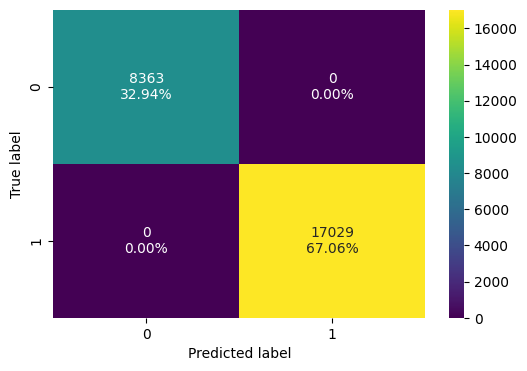

In [75]:
dtree = DecisionTreeClassifier(criterion="gini", class_weight={'Not_Canceled': 0.67, 'Canceled': 0.33}, random_state=1)
dtree.fit(X_train, y_train)
confusion_matrix_sklearn(dtree, X_train, y_train)

In [76]:
from sklearn.metrics import f1_score

y_pred_train = dtree.predict(X_train)
decision_tree_perf_train = f1_score(y_train, y_pred_train, pos_label='Canceled')

print("F1 Score:", decision_tree_perf_train)

F1 Score: 1.0


With an F1 score of 1, it appears my model is overfit...

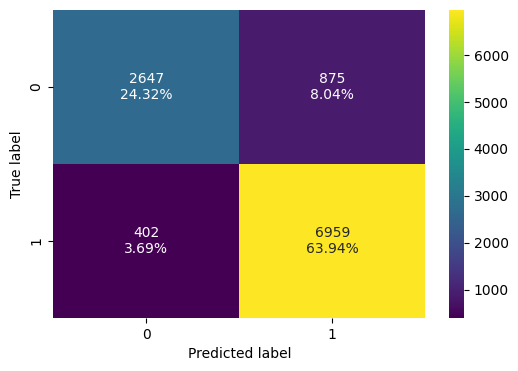

In [77]:
confusion_matrix_sklearn(dtree, X_test, y_test)

In [78]:
from sklearn.metrics import f1_score

y_pred_test = dtree.predict(X_test)
decision_tree_perf_test = f1_score(y_test, y_pred_test, pos_label='Canceled')

print("F1 Score:", decision_tree_perf_test)

F1 Score: 0.8056612387764419


In [79]:
feature_names = X_train.columns.to_list()

In [80]:
print(tree.export_text(dtree, feature_names=feature_names, show_weights=True))

|--- lead_time <= 151.50
|   |--- no_of_special_requests <= 0.50
|   |   |--- market_segment_type_Online <= 0.50
|   |   |   |--- lead_time <= 90.50
|   |   |   |   |--- avg_price_per_room <= 201.50
|   |   |   |   |   |--- no_of_weekend_nights <= 4.50
|   |   |   |   |   |   |--- no_of_weekend_nights <= 0.50
|   |   |   |   |   |   |   |--- market_segment_type_Offline <= 0.50
|   |   |   |   |   |   |   |   |--- lead_time <= 16.50
|   |   |   |   |   |   |   |   |   |--- Booking_ID_INN29880 <= 0.50
|   |   |   |   |   |   |   |   |   |   |--- Booking_ID_INN19599 <= 0.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 42
|   |   |   |   |   |   |   |   |   |   |--- Booking_ID_INN19599 >  0.50
|   |   |   |   |   |   |   |   |   |   |   |--- weights: [0.33, 0.00] class: Canceled
|   |   |   |   |   |   |   |   |   |--- Booking_ID_INN29880 >  0.50
|   |   |   |   |   |   |   |   |   |   |--- weights: [0.33, 0.00] class: Canceled
|   |   |   |   |   |   |   |   

The resulting tree is very complex and difficult to interpret.

In [81]:
print(pd.DataFrame(dtree.feature_importances_, columns=["Imp"], index=X_train.columns).sort_values(
    by="Imp", ascending=False).head(n=10))

                               Imp
lead_time                  0.26610
avg_price_per_room         0.15383
market_segment_type_Online 0.08071
arrival_month              0.05699
no_of_special_requests     0.05069
arrival_date               0.04875
no_of_week_nights          0.02610
no_of_weekend_nights       0.02216
no_of_adults               0.02140
arrival_year               0.00604


In [82]:
print("Accuracy on training set : ",dtree.score(X_train, y_train))
print("Accuracy on test set : ",dtree.score(X_test, y_test))

Accuracy on training set :  1.0
Accuracy on test set :  0.8826610309657263


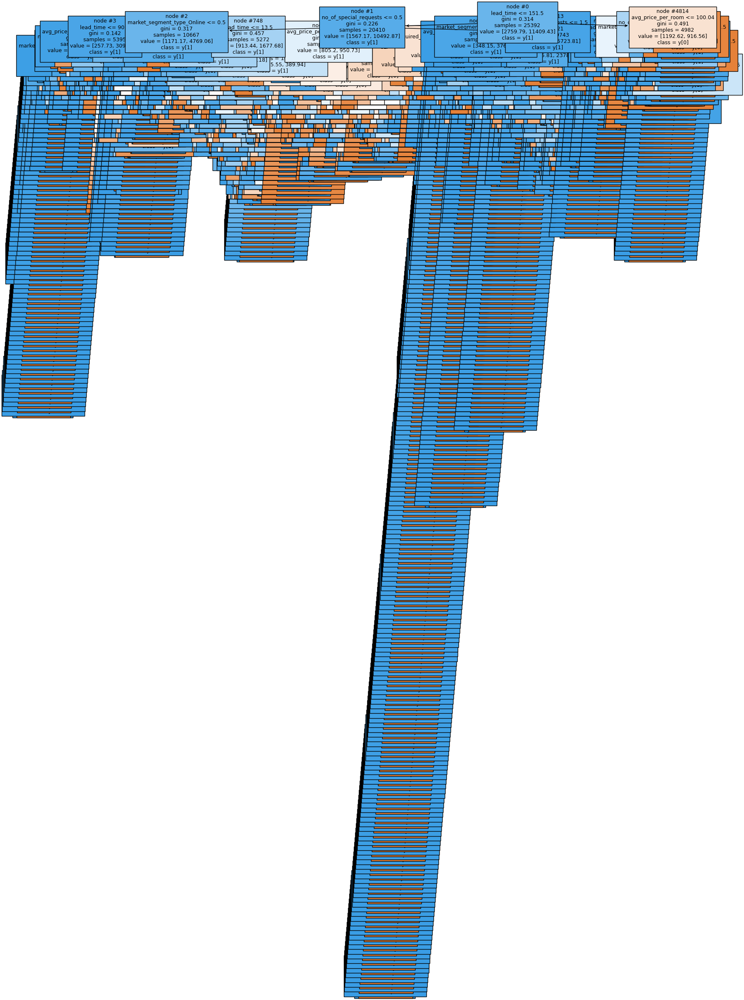

In [83]:
plt.figure(figsize=(20, 30))

out = tree.plot_tree(
    dtree,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=True,
    class_names=True,
)
for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor("black")
        arrow.set_linewidth(1)
plt.show()

### Observations
* It appears that the top 3 most important factors in our decision tree are as follows: `lead_time`, `avg_price_per_room`, and `market_segment_type_Online`
* Though accuracy score on test set was a solid 0.88, it seems my training set suffered from overfitting.

## Actionable Insights and Recommendations

- What profitable policies for cancellations and refunds can the hotel adopt?
- What other recommedations would you suggest to the hotel?

After analyzing the thousands of entries of data regarding cancellation decisions for hotel bookings for INN Hotel in Portugal, we have a lot of general conclusions and business takeaways:
- When comparing logistic regression model with decision tree model, my logistic regression model performed a little better. During building of my model, we got progressively better F1 scores as well as performed well on Accuracy and Precision.
- After visualizing my desicion tree, it appears a little difficult for the client to interpret. Despite efforts to try to improve the decision tree and avoid overfitting, it remained a challenge.
- INN Hotels should weigh the tradeoffs associated with decision-tree models concerning performance, overfitting, and comprehensibility of decision criteria. If prioritizing a more interpretable prediction model, it's worth noting that the decision-tree model needs a minimal depth of 8 to outperform the best logistic regression model. However, if the complexity of the tree remains excessive for the client's needs and preferences, the logistic regression model may be the preferable choice for prediction.
- Exploratory data analysis and predictions from both models strongly suggest that guests booking cheaper rooms, with shorter lead times, requesting parking spaces, are repeat guests, and bring with them a higher number of special requests, especially from the Corporate and Offline market segments, are less inclined to cancel bookings. Conversely, guests booking more expensive rooms, with longer lead times, particularly through the Online market segment, are more prone to cancel bookings.
- There is potential benefit for INN Hotels to implement separate cancellation and refund policies tailored to guests traveling for business or personal reasons. Specifically, the data suggests that creating a rewards program for business travelers, which includes incentives such as more frequent trips, last-minute bookings through corporate channels, and directives to book the lowest-cost rooms, could encourage these guests to choose INN Hotels and stick to their travel plans. Moreover, the models could assist hotel management in ensuring room availability during peak times by prioritizing repeat guests and business travelers when capacity is limited. Conversely, combining predictions from both models could help identify bookings most likely to be canceled, allowing for proactive reallocation of rooms to minimize disruptions.
- Additionally, stricter cancellation policies should be enacted, as our findings reveal a disproportionately high rate of cancellations for bookings made online. In order to avoid the hotel from incurring significant losses, it would be a good idea to require online cancellations to result in reduced refund percentages for customers.
- October and September experienced the peak of both bookings and cancellations, indicating trends that warrant further investigation by the hotel.
- Lastly, it is key to highlight the loyalty of a selection of INN customers. It would be beneficial to improve their experience so not only do they keep coming back but news will spread and and customer base would grow. Not only any customer base but a profitable customer base. Rewards programs for these loyal repeat customers can inlcudde speacial discounts, early or extra access to hospitality services during their stay, and a refer-a-friend system wherein if someone they know books with INN and does NOT cancel, they will get rewarded as well.